In [1]:
from config import *

Начнём с чего-то простого, поробуем обучить UNet на нашем датасете и посмотрим, что получится

Небольшое напоминание
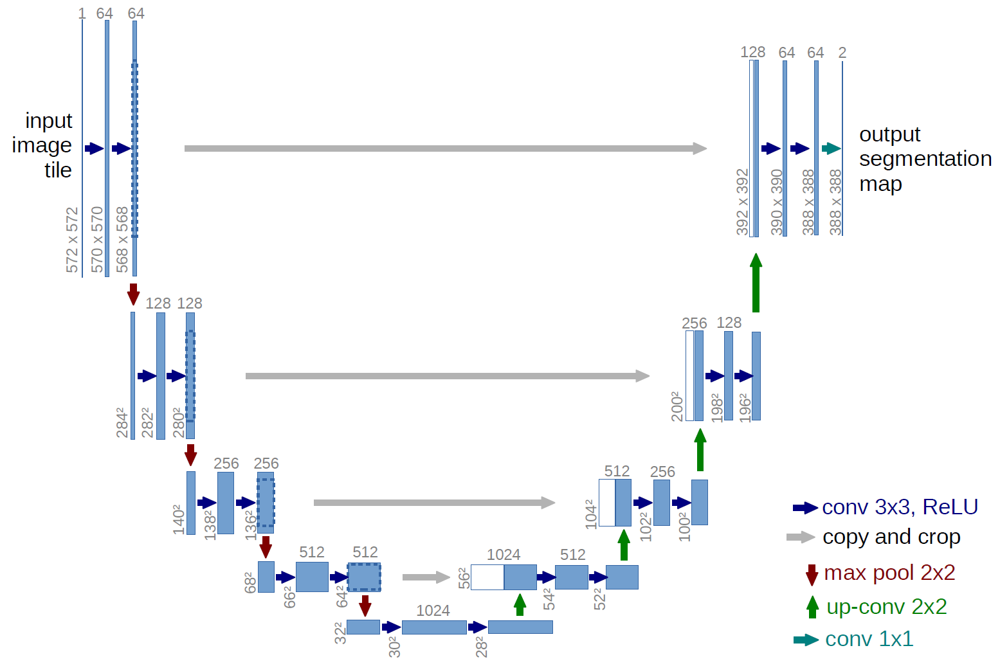

In [2]:
from src.data.dataset import SatelliteDataset
from src.data.paired_transforms.random_crop import PairedRandomCrop
from src.data.paired_transforms.random_flips import PairedRandomHorizontalFlip, PairedRandomVerticalFlip
from src.data.paired_transforms.random_rotation import PairedRandomRotation
from src.data.utils import create_dataloaders, show_dataloader_examples
from src.data.transforms.image_distortions import *

from torchvision.transforms import v2
import torch

In [3]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(device)

cuda


In [4]:
image_transforms = v2.Compose([
    RandomHue((-0.05,0.05)),
    RandomSaturation(),
    RandomBrightness(),
    RandomContrast(),
    v2.ToDtype(torch.float32, scale=True),
])
paired_transforms = v2.Compose([
    PairedRandomHorizontalFlip(),
    PairedRandomVerticalFlip(),
    PairedRandomCrop(INPUT_IMG_SIZE),
    PairedRandomRotation(),
])
dataset = SatelliteDataset(IMAGES_DIR, MASKS_DIR, paired_transforms, image_transforms)
train_dataloader, test_dataloader = create_dataloaders(dataset, 2, 4)

In [5]:
import torch.nn.functional as F
import torch.nn as nn
from src.models.unet.model import UNet
import torch.optim as optim

bce_with_logits = nn.BCEWithLogitsLoss(reduction='sum')
unet = UNet().to(device)
optimizer = optim.Adam(unet.parameters(), lr=4e-4, weight_decay=1e-3)

In [6]:
from src.train_loop import train

Epoch 1/25 [Test]: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 53/53 [00:08<00:00,  6.32it/s, loss=3.83e+5]


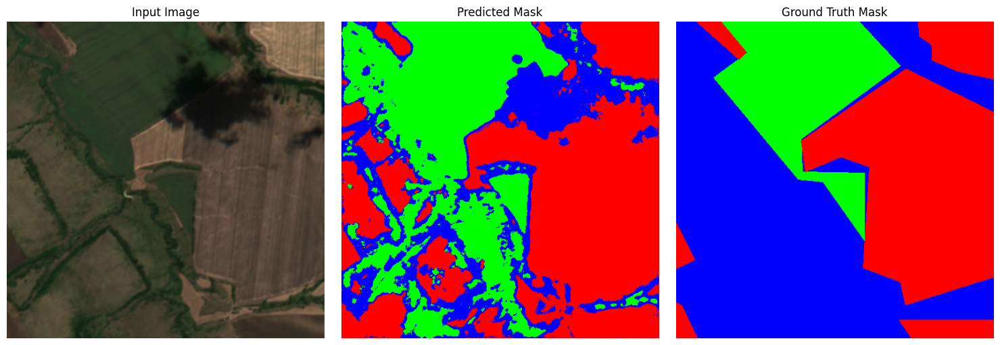

Train Loss = 809783.9258928571. Test Loss = 654932.9452380952


Epoch 2/25 [Test]: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 53/53 [00:08<00:00,  6.34it/s, loss=7.92e+5]


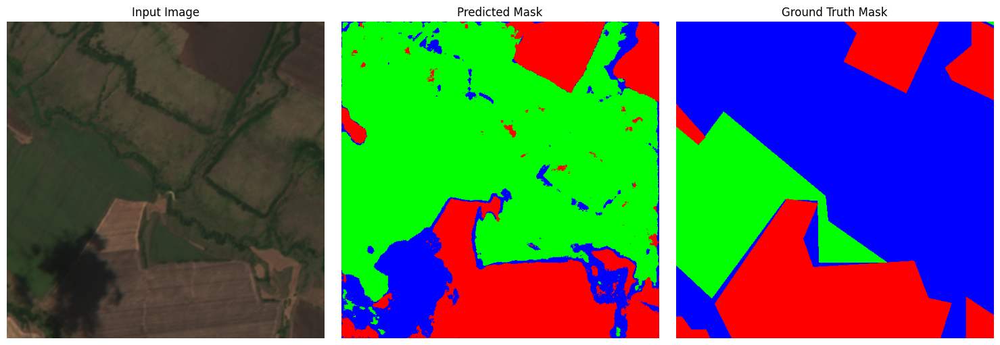

Train Loss = 743240.315625. Test Loss = 763321.5089285715


Epoch 3/25 [Test]: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 53/53 [00:08<00:00,  6.33it/s, loss=1.75e+5]


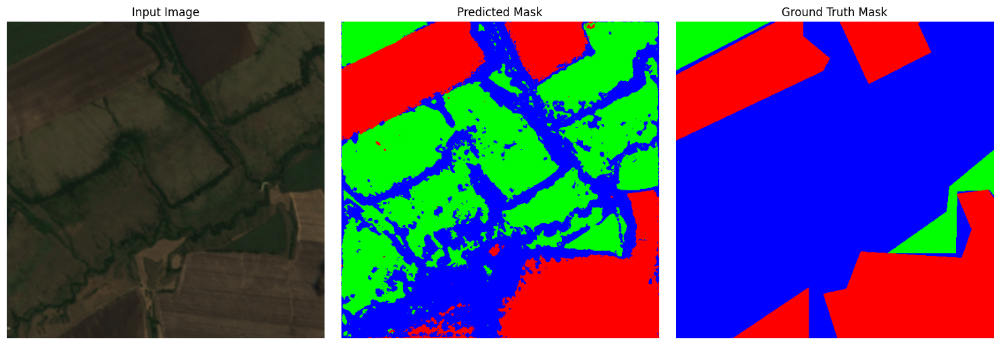

Train Loss = 740628.8447916667. Test Loss = 687819.3160714286


Epoch 4/25 [Test]: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 53/53 [00:08<00:00,  6.35it/s, loss=1.74e+5]


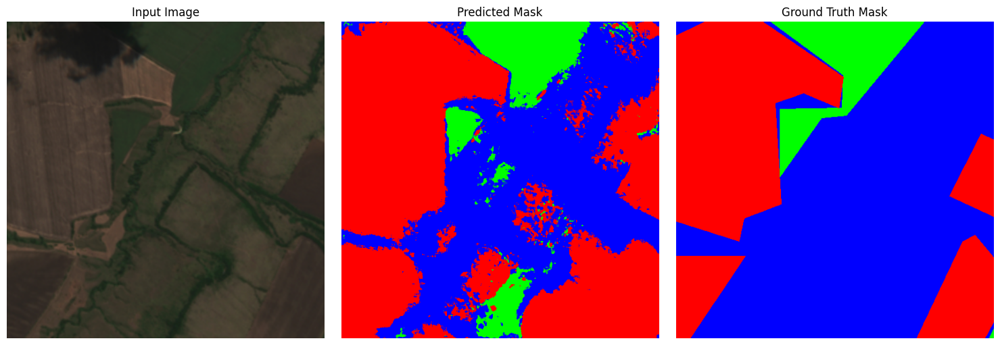

Train Loss = 730828.7699404762. Test Loss = 623944.2479166667


Epoch 5/25 [Test]: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 53/53 [00:08<00:00,  6.33it/s, loss=2.2e+5]


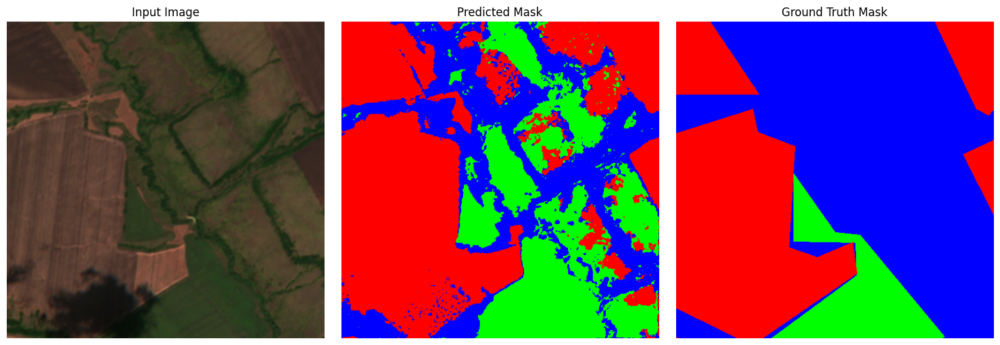

Train Loss = 692562.4497023809. Test Loss = 685889.9392857143


Epoch 6/25 [Test]: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 53/53 [00:08<00:00,  6.34it/s, loss=2e+5]


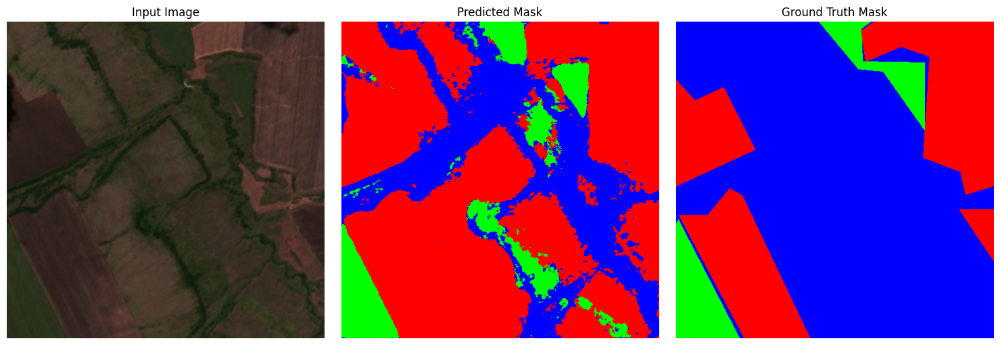

Train Loss = 692092.7650297619. Test Loss = 609028.6199404761


Epoch 7/25 [Test]: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 53/53 [00:08<00:00,  6.34it/s, loss=2e+5]


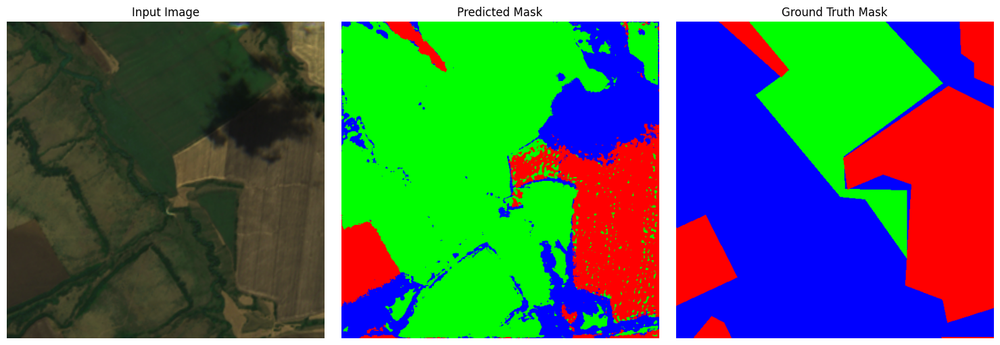

Train Loss = 673233.4367559524. Test Loss = 644914.4985119047


Epoch 8/25 [Test]: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 53/53 [00:08<00:00,  6.33it/s, loss=2.39e+5]


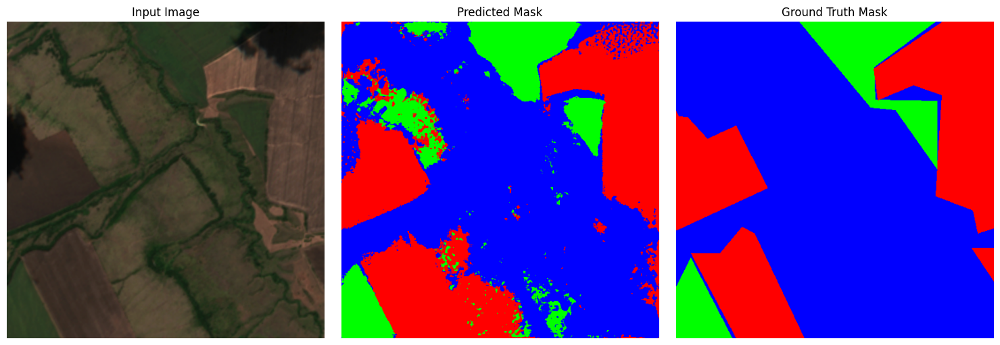

Train Loss = 664983.374702381. Test Loss = 599644.6175595238


Epoch 9/25 [Test]: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 53/53 [00:08<00:00,  6.35it/s, loss=1.22e+5]


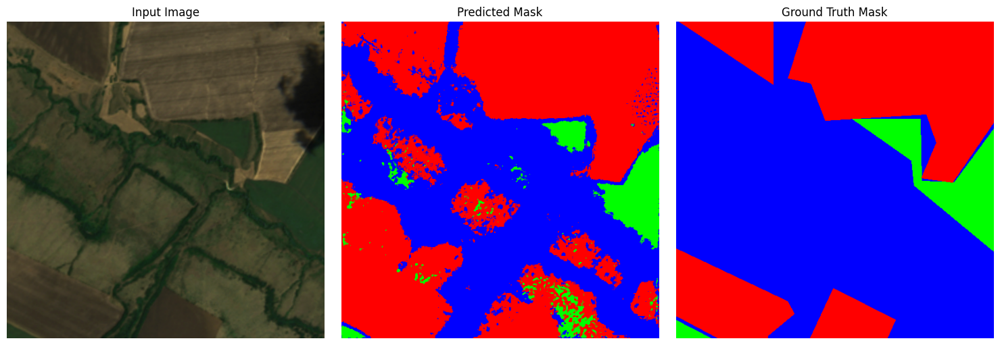

Train Loss = 676980.6081845238. Test Loss = 643051.3053571428


Epoch 10/25 [Test]: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 53/53 [00:08<00:00,  6.34it/s, loss=2.65e+5]


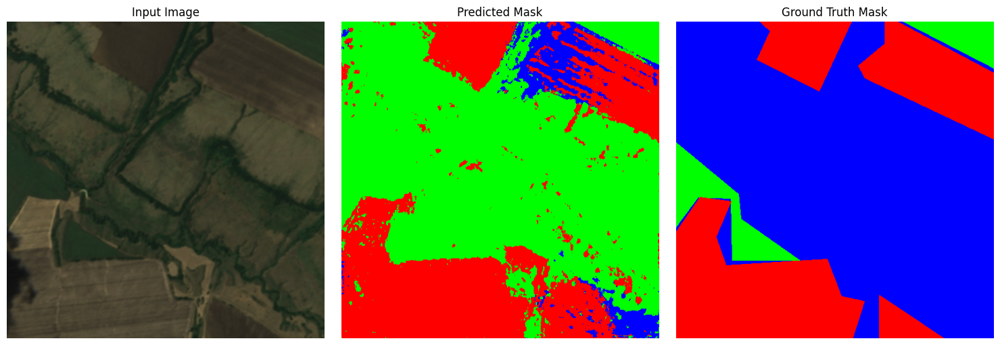

Train Loss = 630174.4833333333. Test Loss = 685510.1946428572


Epoch 11/25 [Test]: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 53/53 [00:08<00:00,  6.31it/s, loss=2.54e+5]


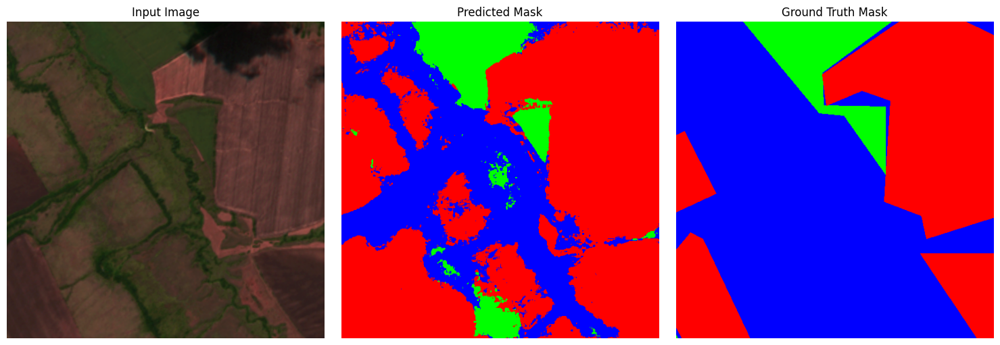

Train Loss = 614421.8963541667. Test Loss = 599570.125297619


Epoch 12/25 [Test]: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 53/53 [00:08<00:00,  6.32it/s, loss=1.33e+5]


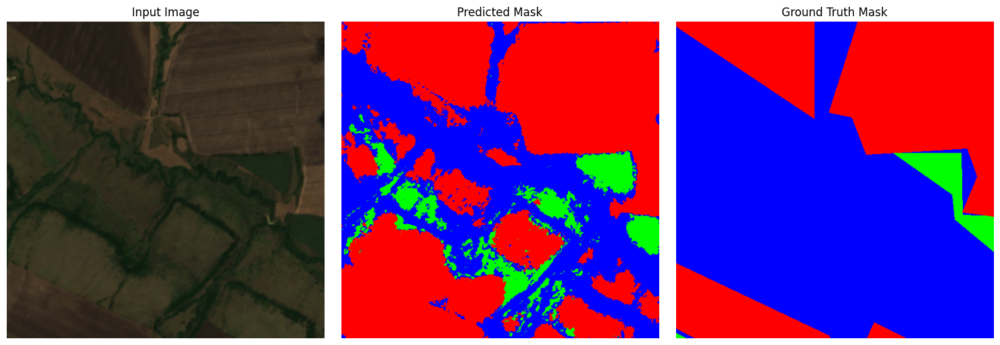

Train Loss = 619453.6819196428. Test Loss = 560590.2613095238


Epoch 13/25 [Test]: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 53/53 [00:08<00:00,  6.35it/s, loss=1.39e+5]


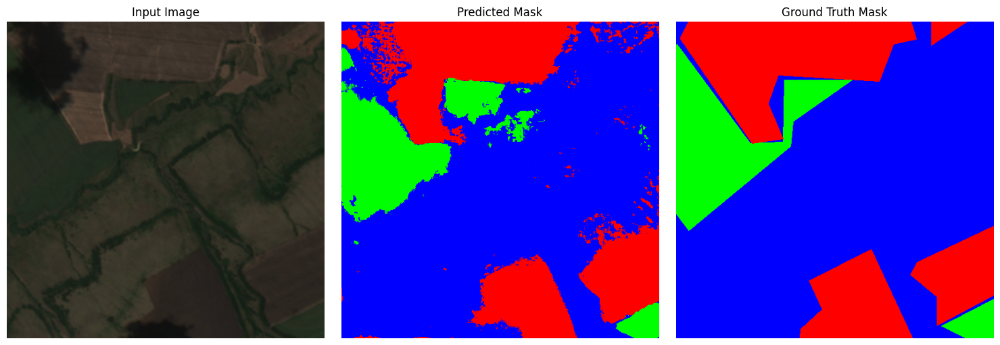

Train Loss = 598451.7747767858. Test Loss = 533778.946875


Epoch 14/25 [Test]: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 53/53 [00:08<00:00,  6.33it/s, loss=5.8e+5]


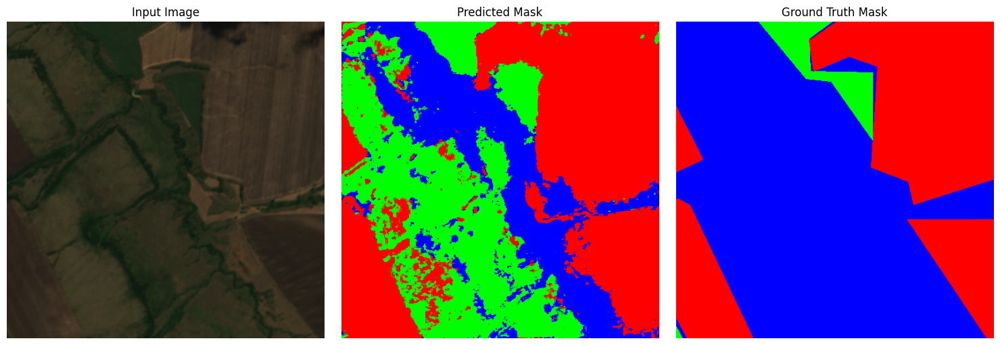

Train Loss = 595147.8494791667. Test Loss = 543051.0086309523


Epoch 15/25 [Test]: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 53/53 [00:08<00:00,  6.34it/s, loss=1.64e+5]


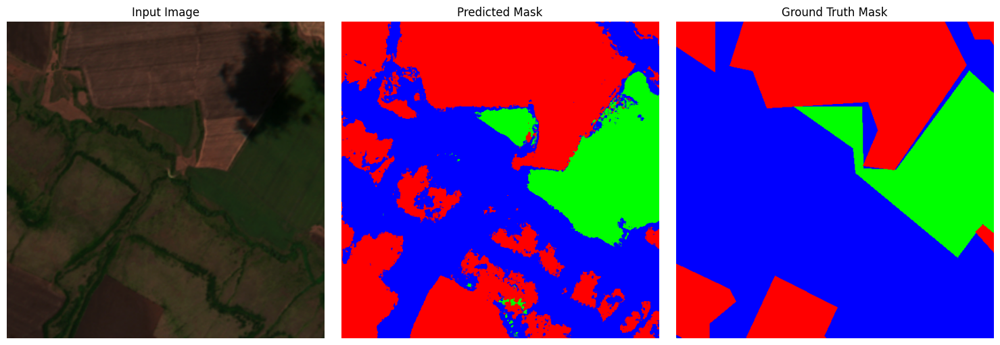

Train Loss = 589956.8857142857. Test Loss = 543880.3285714285


Epoch 16/25 [Test]: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 53/53 [00:08<00:00,  6.34it/s, loss=1.39e+5]


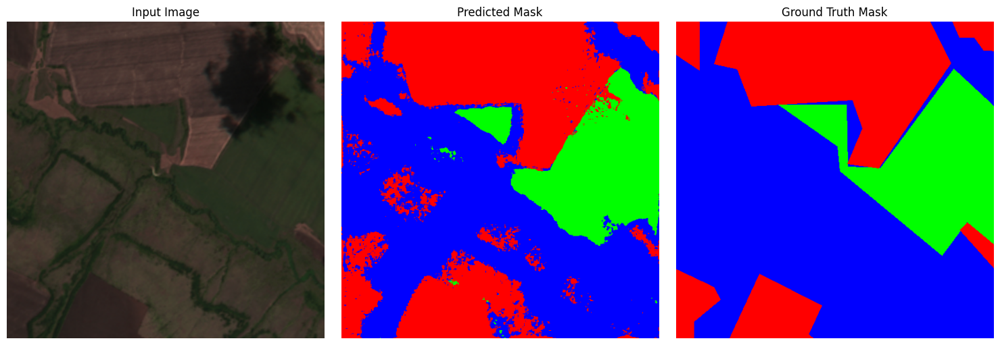

Train Loss = 594390.9508184524. Test Loss = 498821.43898809527


Epoch 17/25 [Test]: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 53/53 [00:08<00:00,  6.30it/s, loss=1.84e+5]


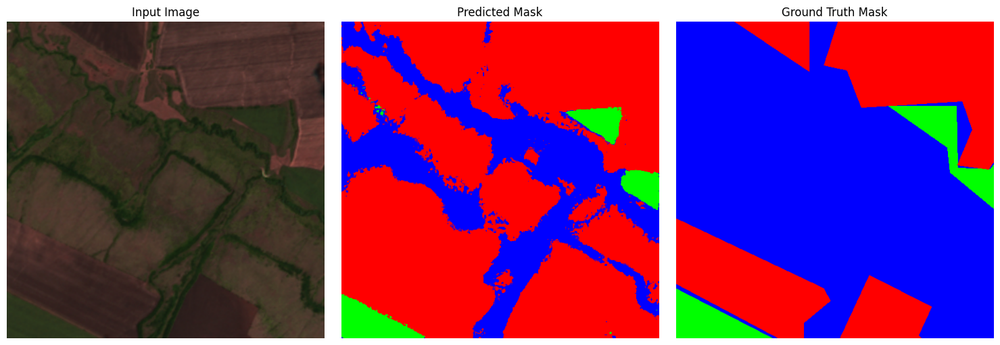

Train Loss = 573242.5593005952. Test Loss = 505303.8886904762


Epoch 18/25 [Test]: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 53/53 [00:08<00:00,  6.32it/s, loss=3.12e+5]


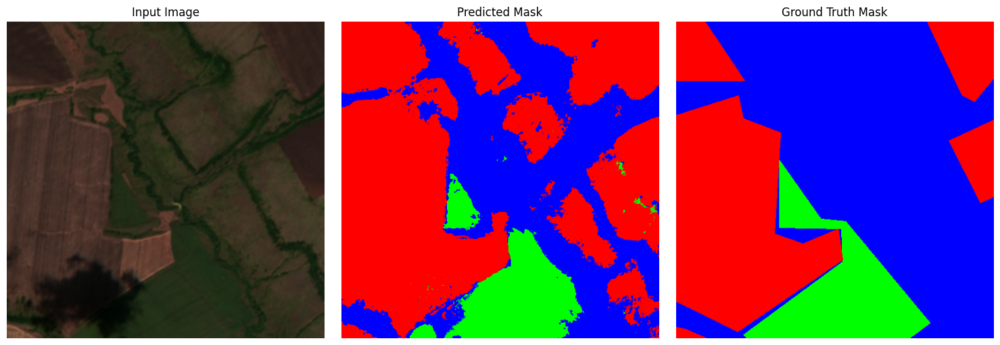

Train Loss = 579874.4223958333. Test Loss = 531498.8693452381


Epoch 19/25 [Test]: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 53/53 [00:08<00:00,  6.35it/s, loss=1.34e+5]


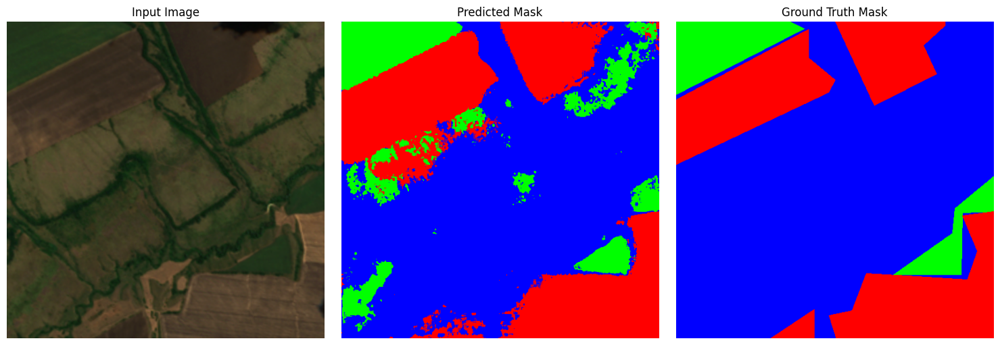

Train Loss = 559479.0412946428. Test Loss = 526934.2370535714


Epoch 20/25 [Test]: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 53/53 [00:08<00:00,  6.34it/s, loss=3.62e+5]


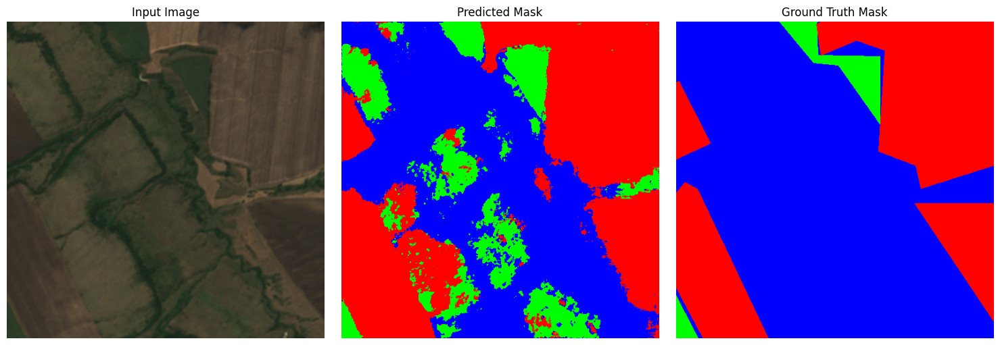

Train Loss = 570323.3863095238. Test Loss = 506600.4755952381


Epoch 21/25 [Test]: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 53/53 [00:08<00:00,  6.30it/s, loss=3e+5]


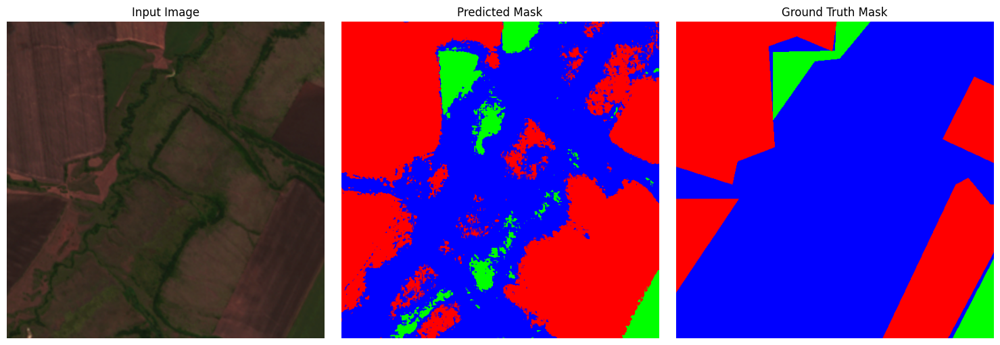

Train Loss = 566884.1980654761. Test Loss = 514008.62232142856


Epoch 22/25 [Test]: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 53/53 [00:08<00:00,  6.32it/s, loss=2e+5]


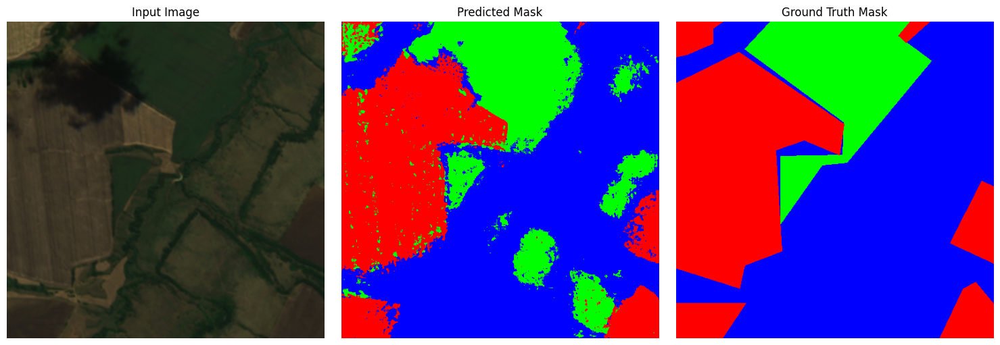

Train Loss = 541288.2911458333. Test Loss = 517186.58928571426


Epoch 23/25 [Test]: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 53/53 [00:08<00:00,  6.34it/s, loss=2.74e+5]


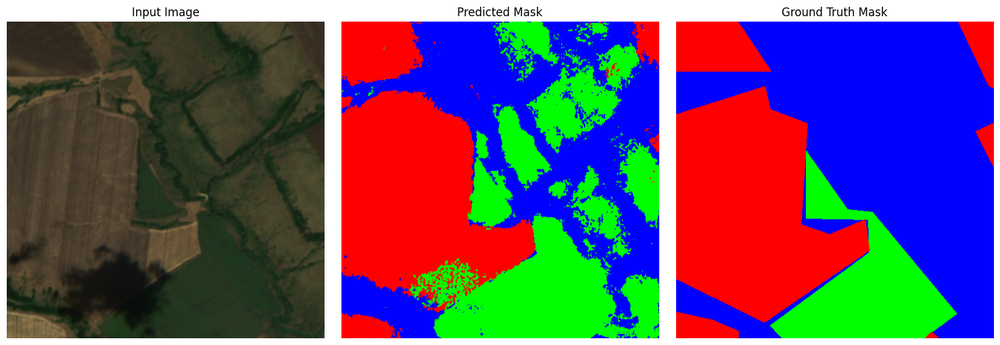

Train Loss = 514567.7516369048. Test Loss = 538106.5815476191


Epoch 24/25 [Test]: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 53/53 [00:08<00:00,  6.33it/s, loss=1.64e+5]


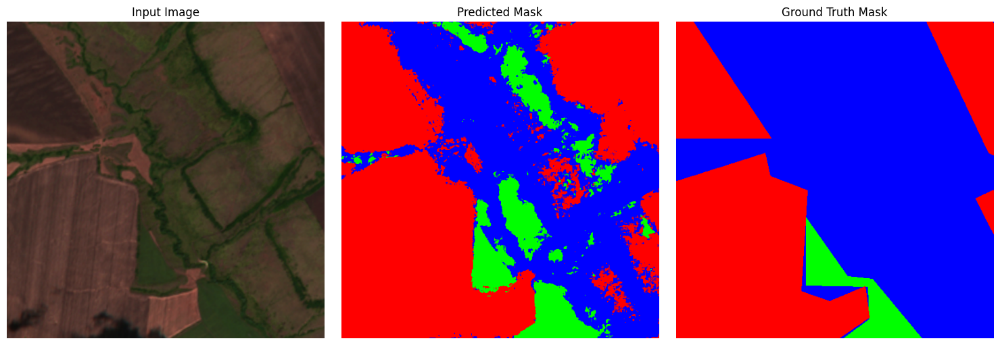

Train Loss = 534545.4072172618. Test Loss = 490269.9550595238


Epoch 25/25 [Test]: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 53/53 [00:08<00:00,  6.35it/s, loss=1.37e+5]


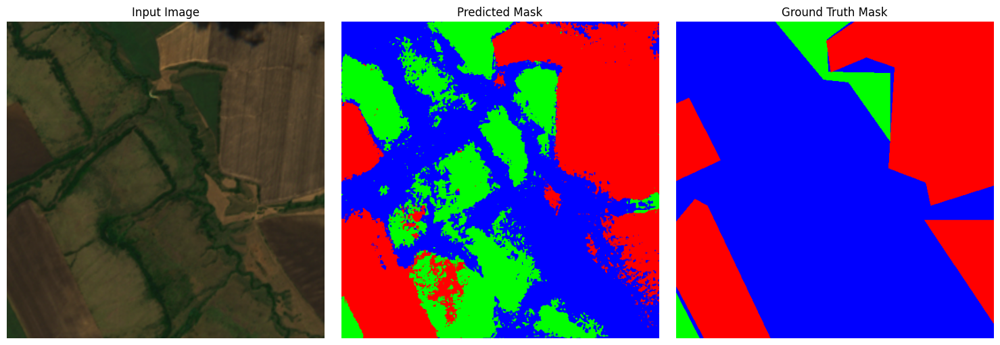

Train Loss = 523723.7238095238. Test Loss = 507394.79583333334


In [7]:
history = train(unet, train_dataloader, test_dataloader, device, optimizer, 25, bce_with_logits, SAVE_DIR + "UNet_1.0")

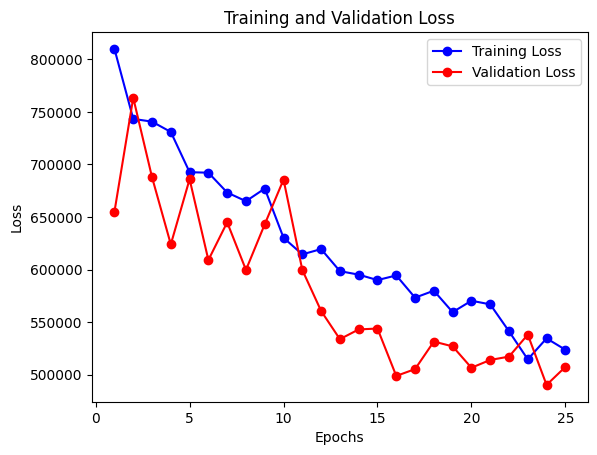

In [9]:
from src.data.utils import plot_history
plot_history(history)

Сомнительный результат, если ещё поучить и добавить post processing может получится что-то рабочее, давайте посмотрим как модель работает на других снимках

Загрузим лучшую в среднем модель (25я эпоха)

In [10]:
unet.load_state_dict(torch.load(SAVE_DIR + 'UNet_1.0_epoch_25.pth'))

<All keys matched successfully>

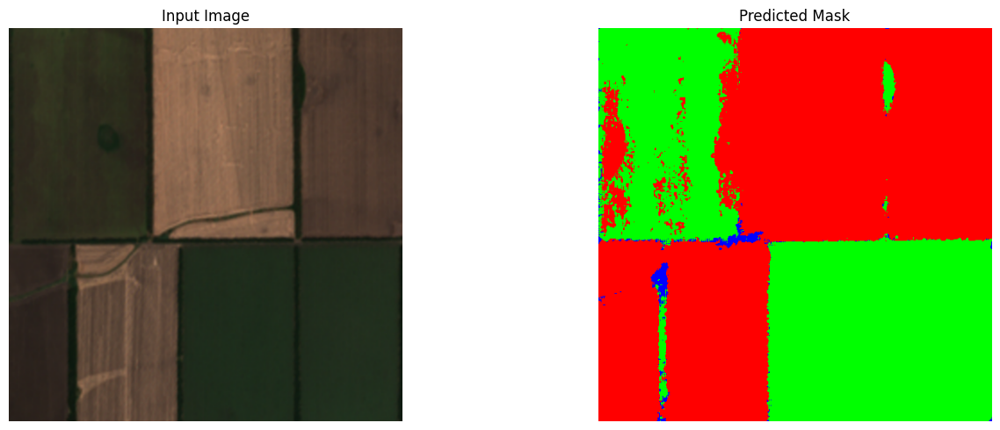

In [11]:
from src.data.utils import show_prediction_image
from PIL import Image
from torchvision.transforms import ToTensor

show_prediction_image(ToTensor()(Image.open(EXAMPLES_DIR + '512x512_fields.png')), unet)

Можно попробовать дообучить, но лучше рассмотрим более продвинутые решения, например DeepLabv3